### Importing libraries

In [1]:
from IPython.display import clear_output
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
import math
import random
from collections import deque
import random
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch as T
import os
import gym
import matplotlib.pyplot as plt
import timeit

#### 1.0 Define tank model

In [2]:
class Tank:
    def __init__(self, height, h0, h_max, h_min, r_tank, pipe_r, SP):
        self.height      = height              #m
        self.init_level  = h0                  #m
        self.max_level   = h_max               #m
        self.min_level   = h_min               #m
        self.radius      = r_tank              #m
        self.pipe_radius = pipe_r              #
        self.A           = r_tank**2*math.pi
        self.A_pipe      = pipe_r**2*math.pi
        self.V           = self.A * self.height
        self.SP          = SP
    
    def get_dhdt(self,h,t, q_in, valve_opening):
        if h > 0:
            q_out = valve_opening*(self.A_pipe*((2*9.81*h)**0.5))
        else:
            q_out = 0
        
        dhdt = (q_in - q_out)/self.A
        
        if h >= self.max_level and dhdt > 0:
            dhdt = 0
        
        return dhdt
    
    def get_level_dynamics(self, time, vol_flow_in, valve_opening, h0):
        z = np.zeros(len(time))
        
        for i in range(len(time)-1):
            pct_opened = valve_opening
            q_in = vol_flow_in[i+1]
            y = odeint(self.get_dhdt, h0, [0,1], args = (q_in, pct_opened))
            h0 = y[-1]
            z[i+1] = h0
            
        return z
        

In [65]:
def get_time(start, end, timestep):
    t = np.linspace(start, end, timestep)
    return t

#### 2.0 Define environment

In [3]:
class Environment:
    def __init__(self,tank):
        self.tank_height = tank.height           
        self.init_level  = tank.init_level             
        self.max_level   = tank.max_level             
        self.min_level   = tank.min_level               
        self.radius      = tank.radius              
        self.pipe_radius = tank.pipe_radius           
        self.A           = tank.A
        self.A_pipe      = tank.A_pipe
        self.terminated  = False
        self.state_space_size = (2,)
        self.SP          = tank.SP

        
    def step(self,level,vol_f, next_vol_f, action):
        h0     = level
        q_in   = vol_f
        pct_opened = action
        y = odeint(tank.get_dhdt, h0, [0,0.1], args = (q_in, pct_opened))
        new_level = float(y[-1])
        level_change = h0 - new_level
        new_vol_f = next_vol_f
        new_state = [new_level, level_change, new_vol_f]
        reward    = self.get_reward(new_level)
        done      = self.is_terminate_state(new_level)
        
        return new_state, reward, done
    
    def is_terminate_state(self, state):
        if state <= self.min_level or state >= self.max_level:
            return True
        else:
            return False
        
    def get_reward(self, state):
        if state > self.max_level or state < self.min_level:
            return -5
        #elif state <(0.3*self.max_level) or state > (0.8*self.max_level):
            #return 0
        elif state < (1.01*self.SP) and state > (0.99*self.SP):
            return 10
        else:
            return 0
        
    def get_inlet_flow(self, iterations):
        sigma = 1
        vol_f = np.array([])
        q_init = 4
        for i in range(0,iterations):
            q_init  = abs(np.random.normal(q_init, 0.005*sigma))
            vol_f = np.append(vol_f, q_init)
        return vol_f

        
    def reset(self):
        '''
        Reset environment to a random state
        '''
        state = np.zeros(3,)
        state[0] = np.random.uniform(3,5)
        state[2] = self.get_inlet_flow(1)[0] 
        return state
        

#### 3.0 DQN Agent definition

In [4]:
class ReplayBuffer():
    def __init__(self, max_size, input_shape, n_actions):
        self.memory_size      = max_size
        self.memory_lenght    = 0
        self.state_memory     = np.zeros((self.memory_size, *input_shape), dtype=np.float32)
        self.new_state_memory = np.zeros((self.memory_size, *input_shape), dtype=np.float32)
        self.action_memory    = np.zeros((self.memory_size), dtype=np.int64)
        self.reward_memory    = np.zeros((self.memory_size), dtype=np.float32)
        self.terminal_memory  = np.zeros((self.memory_size), dtype=np.int64)

    def store_transition(self, state, action, reward, state_, done):
        index = self.memory_lenght % self.memory_size
        self.state_memory[index]     = state
        self.new_state_memory[index] = state_
        self.action_memory[index]    = action
        self.reward_memory[index]    = reward
        self.terminal_memory[index]  = done
        self.memory_lenght          += 1

    def sample_buffer(self, batch_size):
        max_memory = min(self.memory_lenght, self.memory_size)
        batch = np.random.choice(max_memory, batch_size, replace=False)

        states = self.state_memory[batch]
        actions = self.action_memory[batch]
        rewards = self.reward_memory[batch]
        states_ = self.new_state_memory[batch]
        dones = self.terminal_memory[batch]

        return states, actions, rewards, states_, dones

In [5]:
#Define the neural network
class DeepQNetwork(nn.Module):
    def __init__(self, lr, n_actions, name, input_dims, chkpt_dir):
        super(DeepQNetwork, self).__init__()
        self.checkpoint_dir = chkpt_dir
        self.checkpoint_file = os.path.join(self.checkpoint_dir, name)

        self.fc1 = nn.Linear(input_dims[0], 256)
        self.fc2 = nn.Linear(256, 256)
        self.fc3 = nn.Linear(256, 256)
        self.fc4 = nn.Linear(256, n_actions)

        self.optimizer = optim.Adam(self.parameters(), lr=lr)
        self.loss = nn.MSELoss()
        self.device = T.device('cuda:0' if T.cuda.is_available() else 'cpu')
        # self.device = T.device('cpu')
        self.to(self.device)


    def forward(self, state):
        op = F.relu(self.fc1(state))
        op = F.relu(self.fc2(op))
        op = F.relu(self.fc3(op))
        actions = self.fc4(op)

        return actions

    def save_checkpoint(self):
        print('~ New optim found, saving model ~')
        T.save(self.state_dict(), self.checkpoint_file)

    def load_checkpoint(self):
        print('~ Loading saved NN parameters ~')
        self.load_state_dict(T.load(self.checkpoint_file, map_location=T.device('cpu')))

In [6]:
#DQNAgent
class DQNAgent():
    def __init__(self, gamma, epsilon, lr, n_actions, input_dims,
                 memory_size, batch_size, eps_min=0.01, eps_dec=5e-4,
                 replace=1000, algo=None, env_name=None, chkpt_dir='tmp/dqn'):
        self.gamma              = gamma
        self.epsilon            = epsilon
        self.learning_rate      = lr
        self.n_actions          = n_actions
        self.input_dims         = input_dims
        self.batch_size         = batch_size
        self.eps_min            = eps_min
        self.eps_dec            = eps_dec
        self.replace_target_cnt = replace
        self.algo               = algo
        self.env_name           = env_name
        self.chkpt_dir          = chkpt_dir
        self.action_space       = [i for i in np.linspace(0,10, self.n_actions)]
        self.learn_step_counter = 0


        self.memory = ReplayBuffer(memory_size, input_dims, n_actions)

        self.q_eval = DeepQNetwork(self.learning_rate, self.n_actions,
                                   input_dims = self.input_dims,
                                   name = self.env_name+'_'+self.algo+'_q_eval.pt',
                                   chkpt_dir=self.chkpt_dir)

        self.q_next = DeepQNetwork(self.learning_rate, self.n_actions,
                                   input_dims=self.input_dims,
                                   name=self.env_name + '_' + self.algo + '_q_next.pt',
                                   chkpt_dir=self.chkpt_dir)



    def choose_action(self, observation):
        if np.random.random() > self.epsilon:
            state = T.tensor([observation], dtype=T.float).to(self.q_eval.device)
            actions = self.q_eval.forward(state)
            action = T.argmax(actions).item()
        else:
            action = np.random.choice(self.action_space)

        return action
    
    def action_mapper(self, action):
        action_value = action * 10
        return action_value

    def store_transition(self, state, action, reward, state_, done):
        self.memory.store_transition(state, action, reward, state_, done)

    def sample_memory(self):
        state, action, reward, new_state, done = \
            self.memory.sample_buffer(self.batch_size)
        states = T.tensor(state).to(self.q_eval.device)
        rewards = T.tensor(reward).to(self.q_eval.device)
        dones = T.tensor(done).to(self.q_eval.device)
        actions = T.tensor(action).to(self.q_eval.device)
        states_ = T.tensor(new_state).to(self.q_eval.device)

        return states, actions, rewards, states_, dones

    def replace_target_network(self):
        if self.learn_step_counter % self.replace_target_cnt == 0:
            self.q_next.load_state_dict(self.q_eval.state_dict())

    def decrement_epsilon(self):
        self.epsilon = self.epsilon - self.eps_dec \
            if self.epsilon > self.eps_min else self.eps_min

    def save_models(self):
        self.q_eval.save_checkpoint()
        self.q_next.save_checkpoint()

    def load_models(self):
        self.q_eval.load_checkpoint()
        self.q_next.load_checkpoint()

    def learn(self):
        if self.memory.memory_lenght < self.batch_size:
            return

        self.q_eval.optimizer.zero_grad()

        self.replace_target_network()

        states, actions, rewards, states_, dones = self.sample_memory()
        indices = np.arange(self.batch_size)
        q_pred = self.q_eval.forward(states)[indices, actions]

        q_next = self.q_next.forward(states_).max(dim=1)[0]
        q_next[dones] = 0.0
        q_target = rewards + self.gamma*q_next

        loss = self.q_eval.loss(q_target, q_pred).to(self.q_eval.device)
        loss.backward()
        self.q_eval.optimizer.step()
        self.learn_step_counter += 1

        self.decrement_epsilon()

##### Plotting learning curves

In [7]:

def plot_learning_curve(x, scores, epsilons, filename, lines=None):
    fig=plt.figure(figsize = (8,6))
    ax=fig.add_subplot(111, label="1")
    ax2=fig.add_subplot(111, label="2", frame_on=False)

    ax.plot(x, epsilons, color="deepskyblue", linestyle = '--')
    ax.set_xlabel("Cases", color="C0")
    ax.set_ylabel("Epsilon value", color="C0")
    ax.tick_params(axis='x', colors="C0")
    ax.tick_params(axis='y', colors="C0")

    N = len(scores)
    running_avg = np.empty(N)
    for t in range(N):
	    running_avg[t] = np.mean(scores[max(0, t-20):(t+1)])

    ax2.plot(x, running_avg, color="salmon", linewidth = 3)
    ax2.axes.get_xaxis().set_visible(False)
    ax2.yaxis.tick_right()
    ax2.set_ylabel('Score', color="C1")
    ax2.yaxis.set_label_position('right')
    ax2.tick_params(axis='y', colors="C1")

    if filename == True:
         plt.savefig(filename)
    else:
         print('No saving')

    if lines is not None:
        for line in lines:
            plt.axvline(x=line)

#### 4.0 Creating inlet flow with disturbances

In [8]:
tank = Tank(height = 8, h0 = 0.0, h_max = 7, h_min = 0.5, r_tank = 1.5, pipe_r =0.1, SP = 4)
env = Environment(tank)

In [ ]:
vol_f = env.get_inlet_flow(900_000)

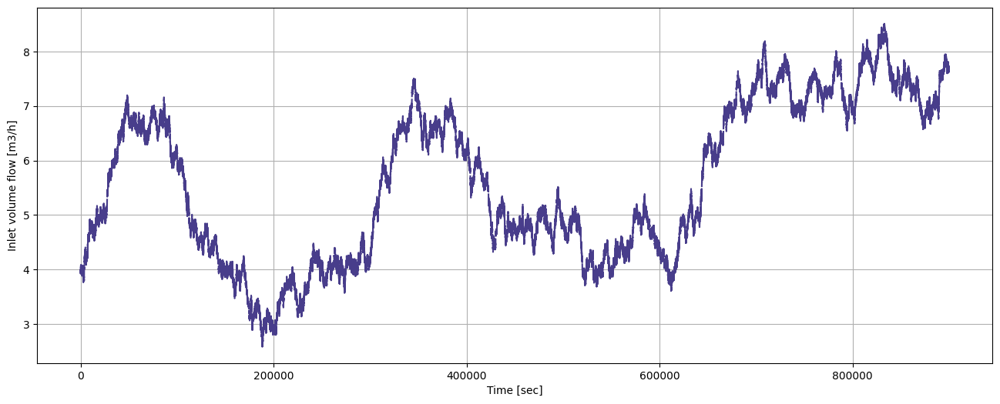

In [ ]:
plt.figure(figsize=(16,6))
plt.grid()
plt.ylabel('Inlet volume flow [m3/h]')
plt.xlabel('Time [sec]')
plt.plot(vol_f, color = 'darkslateblue', linestyle = (0, (5,1)))
plt.show()

##### 5.0 Training the DQL agent

In [ ]:
tank = Tank(height = 8, h0 = 0.0, h_max = 7, h_min = 0.5, r_tank = 1.5, pipe_r =0.1, SP = 4)
env = Environment(tank)

best_score = -np.inf
n_cases = 1500
load_checkpoint = False


agent = DQNAgent(gamma      = 0.99,
                 epsilon    = 1.0,
                 lr         = 0.0001,
                 n_actions  = 31,
                 input_dims = (3,),
                 memory_size = 100_000,
                 batch_size  = 128,
                 eps_min=0.01, eps_dec=4e-6,
                 replace=1000, algo='DQNAgent_64bs_5', env_name='Tank_RL_env', chkpt_dir=r'C:\Users\AroSomogyi\Documents\DQLearning\New')



fname = agent.algo + '_' + agent.env_name + '_lr' + str(agent.learning_rate) + '_' + \
            '_' + str(n_cases) + 'games'
figure_file = False
n_steps = 0
scores, eps_history, steps_array = [], [], []
h0 = 0
max_iterations = 1000



for i in range(n_cases):
    
    done = False
    score = 0
    start = timeit.default_timer()
    observation = env.reset()
    h0 = observation[0]
    iterations = 0
    
    while not done:
        action = agent.choose_action(observation)
        observation_, reward, done = env.step(h0, vol_f[n_steps], vol_f[n_steps], agent.action_mapper(action))
        h0 = observation_[0]
        score += reward
            
        if not load_checkpoint:
            agent.store_transition(observation, action, reward, observation_, int(done))
            agent.learn()
                
        observation = observation_
        if n_steps < (len(vol_f)-1):
            n_steps += 1
        else:
            n_steps = 0
            
        iterations +=1
        if iterations >= max_iterations:
            break
            
    stop = timeit.default_timer()
    #print('Time: ', stop - start)
    scores.append(score)
    steps_array.append(n_steps)
            
    avg_score = np.mean(scores[-100:])
    if i % 5 == 0:
        print('episode', i, 'score: ', score,
              'average score %.1f best score %.1f epsilon %.2f' % (avg_score, best_score, agent.epsilon),'steps ', n_steps)
            
    if avg_score > best_score:
        if not load_checkpoint:
            agent.save_models()
            best_score = avg_score
            
    eps_history.append(agent.epsilon)

    
    

        


#plot_learning_curve(range(n_games), scores, eps_history, figure_file)


episode 0 score:  5 average score 5.0 best score -inf epsilon 1.00 steps  68
~ New optim found, saving model ~
~ New optim found, saving model ~
episode 5 score:  -5 average score -1.7 best score 5.0 epsilon 1.00 steps  372
episode 10 score:  -5 average score -2.3 best score 5.0 epsilon 1.00 steps  645
episode 15 score:  -5 average score -1.9 best score 5.0 epsilon 1.00 steps  879
episode 20 score:  -5 average score -2.1 best score 5.0 epsilon 1.00 steps  1126
episode 25 score:  -5 average score -2.3 best score 5.0 epsilon 0.99 steps  1413
episode 30 score:  -5 average score -2.4 best score 5.0 epsilon 0.99 steps  1663
episode 35 score:  -5 average score -2.8 best score 5.0 epsilon 0.99 steps  1925
episode 40 score:  -5 average score -2.8 best score 5.0 epsilon 0.99 steps  2185
episode 45 score:  -5 average score -2.8 best score 5.0 epsilon 0.99 steps  2457
episode 50 score:  5 average score -2.8 best score 5.0 epsilon 0.99 steps  2736
episode 55 score:  -5 average score -3.0 best scor

C:\Users\AroSomogyi\AppData\Local\Temp\1\ipykernel_19616\1168301770.py:38: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ..\torch\csrc\utils\tensor_new.cpp:248.)
  state = T.tensor([observation], dtype=T.float).to(self.q_eval.device)


episode 155 score:  -5 average score -1.3 best score 5.0 epsilon 0.97 steps  8821
episode 160 score:  -5 average score -1.0 best score 5.0 epsilon 0.96 steps  9200
episode 165 score:  -5 average score -1.2 best score 5.0 epsilon 0.96 steps  9654
episode 170 score:  -5 average score -1.6 best score 5.0 epsilon 0.96 steps  10015
episode 175 score:  -5 average score -1.6 best score 5.0 epsilon 0.96 steps  10344
episode 180 score:  5 average score -1.4 best score 5.0 epsilon 0.96 steps  10739
episode 185 score:  25 average score -1.2 best score 5.0 epsilon 0.96 steps  11122
episode 190 score:  5 average score -1.2 best score 5.0 epsilon 0.95 steps  11585
episode 195 score:  -5 average score -0.8 best score 5.0 epsilon 0.95 steps  11977
episode 200 score:  5 average score -0.9 best score 5.0 epsilon 0.95 steps  12287
episode 205 score:  -5 average score -0.8 best score 5.0 epsilon 0.95 steps  12576
episode 210 score:  -5 average score -0.8 best score 5.0 epsilon 0.95 steps  12929
episode 21

KeyboardInterrupt: 

No saving


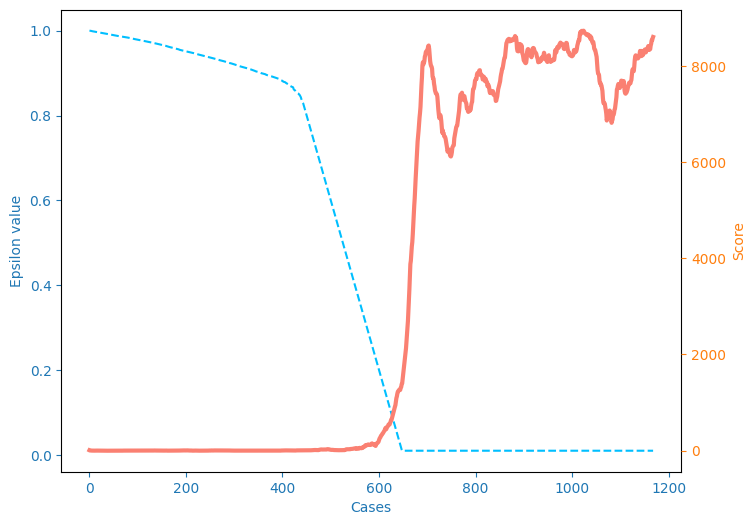

In [ ]:
plot_learning_curve(range(1169), scores, eps_history, filename=False)

##### 6.0 Evaluation of DQL agent

In [16]:
vol_flow = env.get_inlet_flow(200_000)

In [21]:
tank = Tank(height = 8, h0 = 0.0, h_max = 7, h_min = 0.5, r_tank = 1.5, pipe_r =0.1, SP = 4)
env = Environment(tank)

best_score = -np.inf
n_cases = 1
load_checkpoint = True


agent = DQNAgent(gamma      = 0.99,
                 epsilon    = 1.0,
                 lr         = 0.0001,
                 n_actions  = 31,
                 input_dims = (3,),
                 memory_size = 100_000,
                 batch_size  = 128,
                 eps_min=0.01, eps_dec=5e-6,
                 replace=1000, algo='DQNAgent_64bs_5', env_name='Tank_RL_env', chkpt_dir=r'C:\Users\AroSomogyi\Documents\DQLearning\New')


if load_checkpoint:
    agent.load_models()
    agent.epsilon = 0.0

fname = agent.algo + '_' + agent.env_name + '_lr' + str(agent.learning_rate) + '_' + \
            '_' + str(n_cases) + 'games'
figure_file = False
n_steps = 0
new_scores, epsilon_history, new_steps_array = [], [], []
h0 = 0
max_iterations = 100_000
tank_levels, actions = [], []

for i in range(n_cases):
    
    done = False
    score = 0
    start = timeit.default_timer()
    observation = env.reset()
    h0 = observation[0]
    iterations = 0
    
    while not done:
        action = agent.choose_action(observation)
        observation_, reward, done = env.step(h0, vol_flow[n_steps], vol_flow[n_steps], agent.action_mapper(action))
        h0 = observation_[0]
        score += reward
            
        if not load_checkpoint:
            agent.store_transition(observation, action, reward, observation_, int(done))
            agent.learn()
                
        tank_levels.append(h0)
        actions.append(action)
        observation = observation_
        if n_steps < (len(vol_flow)-1):
            n_steps += 1
        else:
            n_steps = 0
            
        stop = timeit.default_timer()
        #print('Time: ', stop - start)
        new_scores.append(score)
        new_steps_array.append(n_steps)
            
        avg_score = np.mean(new_scores[-100:])
        if i % 5 == 0:
            print('episode', i, 'score: ', score,
                      'average score %.1f best score %.1f epsilon %.2f' % (avg_score, best_score, agent.epsilon),'steps ', n_steps)
            
        if avg_score > best_score:
            if not load_checkpoint:
                agent.save_models()
                best_score = avg_score
            
        epsilon_history.append(agent.epsilon)

        iterations +=1

        if iterations >= max_iterations:
            break

~ Loading saved NN parameters ~
~ Loading saved NN parameters ~
episode 0 score:  0 average score 0.0 best score -inf epsilon 0.00 steps  1
episode 0 score:  10 average score 5.0 best score -inf epsilon 0.00 steps  2
episode 0 score:  20 average score 10.0 best score -inf epsilon 0.00 steps  3
episode 0 score:  30 average score 15.0 best score -inf epsilon 0.00 steps  4
episode 0 score:  40 average score 20.0 best score -inf epsilon 0.00 steps  5
episode 0 score:  50 average score 25.0 best score -inf epsilon 0.00 steps  6
episode 0 score:  60 average score 30.0 best score -inf epsilon 0.00 steps  7
episode 0 score:  70 average score 35.0 best score -inf epsilon 0.00 steps  8
episode 0 score:  80 average score 40.0 best score -inf epsilon 0.00 steps  9
episode 0 score:  90 average score 45.0 best score -inf epsilon 0.00 steps  10
episode 0 score:  100 average score 50.0 best score -inf epsilon 0.00 steps  11
episode 0 score:  110 average score 55.0 best score -inf epsilon 0.00 steps  1

In [22]:
new_actions =  []

for i in actions:
    new_actions.append(i*10)


C:\Users\AroSomogyi\AppData\Local\Temp\1\ipykernel_9744\1818267643.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(3,1,1)


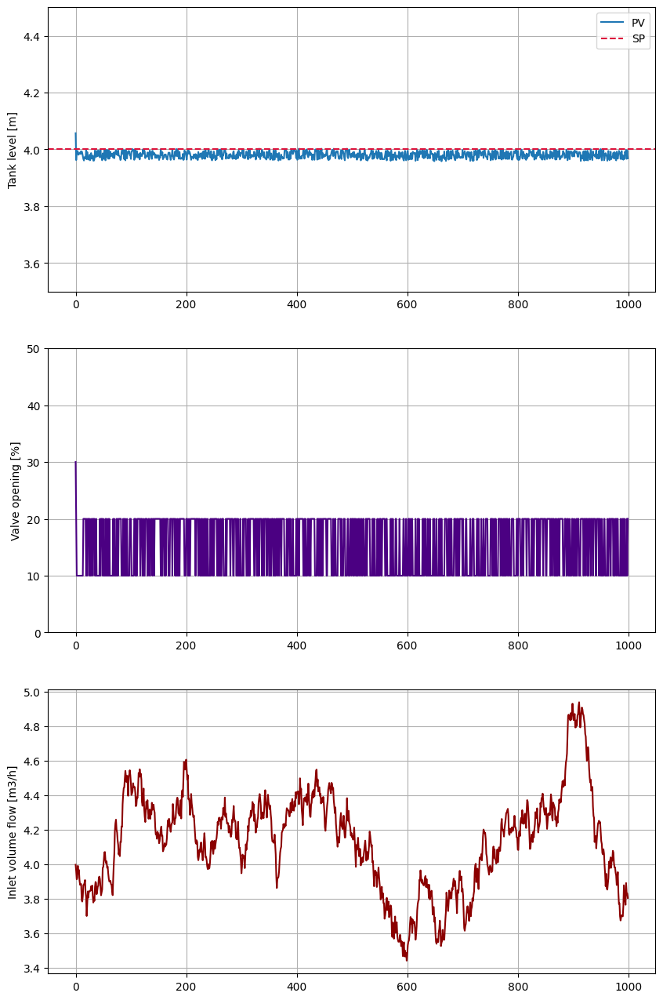

In [32]:
plt.figure(figsize = (10,16))
plt.title('Tank level control with ')
plt.subplot(3,1,1)
plt.plot(tank_levels[::100], label = 'PV')
plt.axhline(tank.SP, color = 'crimson', linestyle = '--', label = 'SP')
plt.ylim(0,tank.height)
plt.legend()
plt.ylabel('Tank level [m]')
plt.ylim(3.5,4.5)
#plt.xlim(0,10000)
plt.grid()
plt.subplot(3,1,2)
plt.plot(new_actions[::100], color = 'indigo')
plt.yticks(np.arange(0,100,10))
plt.ylabel('Valve opening [%]')
plt.ylim(0,50)
plt.grid()
plt.subplot(3,1,3)
plt.plot(vol_flow[:len(tank_levels):100], color = 'darkred')
plt.ylabel('Inlet volume flow [m3/h]')
plt.grid()

##### Reward function

In [40]:
tank = Tank(height = 8, h0 = 0.0, h_max = 7, h_min = 0.5, r_tank = 1.5, pipe_r =0.1, SP = 4)
env = Environment(tank)

In [54]:
states = np.linspace(0,9,10000)
rewards=[]

for state in states:
    reward = env.get_reward(state)
    rewards.append(reward)

In [48]:
env.get_reward(3.6)

0

(0.0, 8.0)

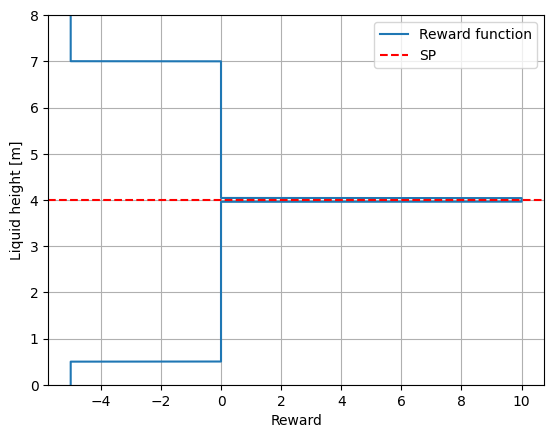

In [59]:
plt.plot(rewards, states, label ='Reward function')
plt.axhline(4, color = 'red', linestyle = '--', label ='SP')
plt.ylabel('Liquid height [m]')
plt.xlabel('Reward')
plt.legend()
plt.grid()
plt.ylim(0,8)
